# CODEX pipeline

In this tutorial, we will analyze the CODEX images provided by Schürch et. al: 
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7479520/

Here, we will use pathml to process a large number of CODEX slides (140 slides) simultaneously through its SlideDataset class. We also show how the generated count matrices can be used to investigate the complex spatial architecture of the iTME in colorectal cancer. 

In [3]:
# set working directory
cd  '~/Documents/Research/Projects/CRC_TMA'

/Users/mohamedomar/Documents/Research/Projects/CRC_TMA


In [1]:
from os import listdir,path,getcwd
import glob
import pandas as pd
from pathml.core import SlideDataset
from pathml.core.slide_data import VectraSlide
from pathml.core.slide_data import CODEXSlide
from pathml.preprocessing.pipeline import Pipeline
from pathml.preprocessing.transforms import SegmentMIF, QuantifyMIF, CollapseRunsCODEX
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from dask.distributed import Client, LocalCluster
from deepcell.utils.plot_utils import make_outline_overlay
from deepcell.utils.plot_utils import create_rgb_image
import scanpy as sc
import squidpy as sq
import anndata as ad
import bbknn
from joblib import parallel_backend

In /Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be re

In [4]:
## Read channel names
channelnames = pd.read_csv("data/channelNames.txt", header = None, dtype = str, low_memory=False)

In [199]:
channelnames

,0
0,HOECHST1
1,blank
2,blank
3,blank
4,HOECHST2
...,...
87,empty-Cy5-22
88,HOECHST23
89,empty-A488-23
90,empty-Cy3-23


# Reading the slides

In [6]:
dirpath_A = r"/Volumes/Mohamed/TMA_A/bestFocus"
dirpath_B = r"/Volumes/Mohamed/TMA_B/bestFocus"

# assuming that all slides are in a single directory, all with .tif file extension
vectra_paths_A = glob.glob(path.join(dirpath_A, "*.tif"))
vectra_paths_B = glob.glob(path.join(dirpath_B, "*.tif"))

# create a list of SlideData objects by loading each path
vectra_list_A = [CODEXSlide(p, stain='IF') for p in vectra_paths_A]
vectra_list_B = [CODEXSlide(p, stain='IF') for p in vectra_paths_B]

initialize a SlideDataset

In [7]:
dataset_A = SlideDataset(vectra_list_A)
dataset_B = SlideDataset(vectra_list_B)

# Define and run the preprocessing pipeline

In [8]:
# Here, we use DAPI (channel 0) and vimentin (channel 29) for segmentation
# Z=0 since we are processing images with a single plane (best focus)
pipe = Pipeline([
    CollapseRunsCODEX(z=0),
    SegmentMIF(model='mesmer', nuclear_channel=0, cytoplasm_channel=29, image_resolution=0.377442),
    QuantifyMIF(segmentation_mask='cell_segmentation')
])

In [10]:
# Initialize a dask cluster using 10 workers
cluster = LocalCluster(n_workers=10, threads_per_worker=1, processes=True)
client = Client(cluster)

/Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 63589 instead
  warnings.warn(


In [ ]:
# Run the pipeline
dataset_A.run(pipe, distributed = True, client = client, tile_size=(1920,1440), tile_pad=False)
dataset_B.run(pipe, distributed = True, client = client, tile_size=(1920,1440), tile_pad=False)

In [ ]:
# Write the processed datasets to disk
dataset_A.write('data/datasetA_processed.h5')
dataset_B.write('data/datasetB_processed.h5')

# Extract and concatenate the resulting count matrices

In [ ]:
# clean the slide names
for i in dataset_A.slides:
    i.name = i.name.replace("_", "")
    i.name = i.name.replace("X01Y01", "")

for i in dataset_B.slides:
    i.name = i.name.replace("_", "")
    i.name = i.name.replace("X01Y01", "")

In [ ]:
############################################################
# concatenate the resulting count matrices in 1 file

all_results_A = {}
all_results_B = {}

In [ ]:
for i in dataset_A.slides:
    results = i.counts
    all_results_A[i] = results
    
for i in dataset_B.slides:
    results = i.counts
    all_results_B[i] = results    

 Combine the count matrices into a single adata object:

For dataset A

In [ ]:
##  Combine the count matrices into a single adata object:

# For dataset A:
adata_combined_A = ad.concat(all_results_A, join="outer", label="Region", index_unique='_')
# Fix and replace the regions names
origin_A = adata_combined_A.obs['Region']
origin_A = origin_A.astype(str).str.replace("[^a-zA-Z0-9 \n\.]", "")
origin_A = origin_A.astype(str).str.replace("[\n]", "")
origin_A = origin_A.str.replace("SlideDataname", "")
origin_A = origin_A.str.replace("X.*", "")
origin_A = origin_A +'_A'
adata_combined_A.obs['Region'] = origin_A

# save the adata object
adata_combined_A.write(filename='./data/loomCombined_A.h5ad')
adata_combined_A = ad.read_h5ad(filename='./data/loomCombined_A.h5ad', chunk_size=100000)

In [ ]:
# For dataset B: 
adata_combined_B = ad.concat(all_results_B, join="outer", label="Region", index_unique='_')
origin_B = adata_combined_B.obs['Region']
origin_B = origin_B.astype(str).str.replace("[^a-zA-Z0-9 \n\.]", "")
origin_B = origin_B.astype(str).str.replace("[\n]", "")
origin_B = origin_B.str.replace("SlideDataname", "")
origin_B = origin_B.str.replace("Z.*", "")
origin_B = origin_B+'_B'
adata_combined_B.obs['Region'] = origin_B

# save the adata object
adata_combined_B.write(filename='./data/loomCombined_B.h5ad')
adata_combined_B = ad.read_h5ad(filename='./data/loomCombined_B.h5ad', chunk_size=100000)

In [ ]:
# Combine adata A and B: 
all_looms = [adata_combined_A, adata_combined_B]
adata_combined_All = ad.concat(all_looms, join = 'outer', label = 'TMA', index_unique='_')

In [63]:
# inspect the adata object
adata_combined_All

AnnData object with n_obs × n_vars = 406958 × 92
    obs: 'Region', 'coords', 'euler_number', 'filled_area', 'slice', 'tile', 'x', 'y', 'TMA'
    obsm: 'spatial'
    layers: 'max_intensity', 'min_intensity'

In [62]:
# Look at the channel names
adata_combined_All.var_names

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36',
       '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48',
       '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60',
       '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72',
       '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84',
       '85', '86', '87', '88', '89', '90', '91'],
      dtype='object')

In [64]:
# Rename the variable names (channels) in the adata object
adata_combined_All.var_names = channelnames[0]
adata_combined_All.var_names_make_unique()
adata_combined_All.var_names


Index(['HOECHST1', 'blank', 'blank-1', 'blank-2', 'HOECHST2', 'CD44 - stroma',
       'FOXP3 - regulatory T cells', 'CDX2 - intestinal epithelia', 'HOECHST3',
       'CD8 - cytotoxic T cells', 'p53 - tumor suppressor',
       'GATA3 - Th2 helper T cells', 'HOECHST4', 'CD45 - hematopoietic cells',
       'T-bet - Th1 cells', 'beta-catenin - Wnt signaling', 'HOECHST5',
       'HLA-DR - MHC-II', 'PD-L1 - checkpoint', 'Ki67 - proliferation',
       'HOECHST6', 'CD45RA - naive T cells', 'CD4 - T helper cells',
       'CD21 - DCs', 'HOECHST7', 'MUC-1 - epithelia', 'CD30 - costimulator',
       'CD2 - T cells', 'HOECHST8', 'Vimentin - cytoplasm', 'CD20 - B cells',
       'LAG-3 - checkpoint', 'HOECHST9', 'Na-K-ATPase - membranes',
       'CD5 - T cells', 'IDO-1 - metabolism', 'HOECHST10',
       'Cytokeratin - epithelia', 'CD11b - macrophages', 'CD56 - NK cells',
       'HOECHST11', 'aSMA - smooth muscle', 'BCL-2 - apoptosis',
       'CD25 - IL-2 Ra', 'HOECHST12', 'Collagen IV - bas. memb.',


Filter the cells using the DAPI and DRAQ5 intensity

/Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'coords' as categorical
/Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'slice' as categorical


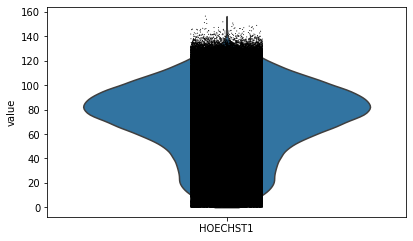

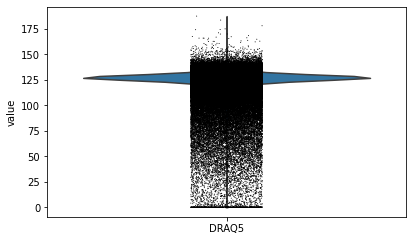

In [65]:

# Plot the DAPI intensity distribution: 
sc.pl.violin(adata_combined_All, keys=['HOECHST1'])
sc.pl.violin(adata_combined_All, keys=['DRAQ5'])

In [67]:
# Remove cells with low DAPI intensity (most likely artifacts)
adata_combined_All = adata_combined_All[adata_combined_All[: , 'HOECHST1'].X > 60, :]
adata_combined_All = adata_combined_All[adata_combined_All[: , 'DRAQ5'].X > 100, :]
adata_combined_All

View of AnnData object with n_obs × n_vars = 272829 × 92
    obs: 'Region', 'coords', 'euler_number', 'filled_area', 'slice', 'tile', 'x', 'y', 'TMA'
    obsm: 'spatial'
    layers: 'max_intensity', 'min_intensity'

In [68]:
# Remove the empty and nuclear channels
keep = ['CD44 - stroma', 'FOXP3 - regulatory T cells', 'CD8 - cytotoxic T cells', 'p53 - tumor suppressor', 'GATA3 - Th2 helper T cells', 'CD45 - hematopoietic cells', 'T-bet - Th1 cells', 'beta-catenin - Wnt signaling', 'HLA-DR - MHC-II', 'PD-L1 - checkpoint', 'Ki67 - proliferation', 'CD45RA - naive T cells', 'CD4 - T helper cells', 'MUC-1 - epithelia', 'CD30 - costimulator', 'CD2 - T cells', 'Vimentin - cytoplasm', 'CD20 - B cells', 'LAG-3 - checkpoint', 'Na-K-ATPase - membranes', 'CD5 - T cells', 'IDO-1 - metabolism', 'Cytokeratin - epithelia', 'CD11b - macrophages', 'CD56 - NK cells', 'aSMA - smooth muscle', 'BCL-2 - apoptosis', 'CD25 - IL-2 Ra', 'PD-1 - checkpoint', 'Granzyme B - cytotoxicity', 'EGFR - singling', 'VISTA - costimulator', 'CD15 - granulocytes', 'ICOS - costimulator', 'Synaptophysin - neuroendocrine', 'GFAP - nerves', 'CD7 - T cells', 'CD3 - T cells', 'Chromogranin A - neuroendocrine', 'CD163 - macrophages', 'CD45RO - memory cells', 'CD68 - macrophages', 'CD31 - vasculature', 'Podoplanin - lymphatics', 'CD34 - vasculature', 'CD38 - multifunctional', 'CD138 - plasma cells']
adata_combined_All = adata_combined_All[:, keep]

In [69]:
adata_combined_All

View of AnnData object with n_obs × n_vars = 272829 × 47
    obs: 'Region', 'coords', 'euler_number', 'filled_area', 'slice', 'tile', 'x', 'y', 'TMA'
    obsm: 'spatial'
    layers: 'max_intensity', 'min_intensity'

In [70]:
# Rename the markers
adata_combined_All.var_names = ['CD44-stroma', 'FOXP3-Treg', 'CD8', 'p53', 'GATA3-Th2', 'CD45-hematopoietic', 'T-bet-Th1', 'beta-cat', 'HLA-DR', 'PD-L1', 'Ki67', 'CD45RA-naiveT', 'CD4', 'MUC-1-epithelia', 'CD30-costimulator', 'CD2-Tcells', 'Vimentin', 'CD20', 'LAG-3-checkpoint', 'Na-K-ATPase', 'CD5-Tcells', 'IDO-1-metabolism', 'Cytokeratin', 'CD11b-macrophages', 'CD56-NK cells', 'aSMA-smooth muscle', 'BCL-2-apoptosis', 'CD25-IL-2Ra', 'PD-1-checkpoint', 'Granzyme B-cytotoxicity', 'EGFR', 'VISTA-costimulator', 'CD15-granulocytes', 'ICOS-costimulator', 'Synaptophysin-neuroendocrine', 'GFAP-nerves', 'CD7-Tcells', 'CD3-Tcells', 'ChromograninA-neuroendocrine', 'CD163-macrophages', 'CD45RO-memory cells', 'CD68-macrophages', 'CD31-vasculature', 'Podoplanin-lymphatics', 'CD34-vasculature', 'CD38-multifunctional', 'CD138-plasma cells']

In [71]:
# store the raw data for further use (DE)
adata_combined_All.raw = adata_combined_All

In [72]:
## Add patients and groups info:

# Annotation dict for patients
regions_to_patients = dict(
reg001_A = '1',
reg001_B = '1',
reg002_A = '1',
reg002_B = '1',
reg003_A = '2',
reg003_B = '2',
reg004_A = '2',
reg004_B = '2',
reg005_A = '3',
reg005_B = '3',
reg006_A = '3',
reg006_B = '3',
reg007_A = '4',
reg007_B = '4',
reg008_A = '4',
reg008_B = '4',
reg009_A = '5',
reg009_B = '5',
reg010_A = '5',
reg010_B = '5',
reg011_A = '6',
reg011_B = '6',
reg012_A = '6',
reg012_B = '6',
reg013_A = '7',
reg013_B = '7',
reg014_A = '7',
reg014_B = '7',
reg015_A = '8',
reg015_B = '8',
reg016_A = '8',
reg016_B = '8',
reg017_A = '9',
reg017_B = '9',
reg018_A = '9',
reg018_B = '9',
reg019_A = '10',
reg019_B = '10',
reg020_A = '10',
reg020_B = '10',
reg021_A = '11',
reg021_B = '11',
reg022_A = '11',
reg022_B = '11',
reg023_A = '12',
reg023_B = '12',
reg024_A = '12',
reg024_B = '12',
reg025_A = '13',
reg025_B = '13',
reg026_A = '13',
reg026_B = '13',
reg027_A = '14',
reg027_B = '14',
reg028_A = '14',
reg028_B = '14',
reg029_A = '15',
reg029_B = '15',
reg030_A = '15',
reg030_B = '15',
reg031_A = '16',
reg031_B = '16',
reg032_A = '16',
reg032_B = '16',
reg033_A = '17',
reg033_B = '17',
reg034_A = '17',
reg034_B = '17',
reg035_A = '18',
reg035_B = '18',
reg036_A = '18',
reg036_B = '18',
reg037_A = '19',
reg037_B = '19',
reg038_A = '19',
reg038_B = '19',
reg039_A = '20',
reg039_B = '20',
reg040_A = '20',
reg040_B = '20',
reg041_A = '21',
reg041_B = '21',
reg042_A = '21',
reg042_B = '21',
reg043_A = '22',
reg043_B = '22',
reg044_A = '22',
reg044_B = '22',
reg045_A = '23',
reg045_B = '23',
reg046_A = '23',
reg046_B = '23',
reg047_A = '24',
reg047_B = '24',
reg048_A = '24',
reg048_B = '24',
reg049_A = '25',
reg049_B = '25',
reg050_A = '25',
reg050_B = '25',
reg051_A = '26',
reg051_B = '26',
reg052_A = '26',
reg052_B = '26',
reg053_A = '27',
reg053_B = '27',
reg054_A = '27',
reg054_B = '27',
reg055_A = '28',
reg055_B = '28',
reg056_A = '28',
reg056_B = '28',
reg057_A = '29',
reg057_B = '29',
reg058_A = '29',
reg058_B = '29',
reg059_A = '30',
reg059_B = '30',
reg060_A = '30',
reg060_B = '30',
reg061_A = '31',
reg061_B = '31',
reg062_A = '31',
reg062_B = '31',
reg063_A = '32',
reg063_B = '32',
reg064_A = '32',
reg064_B = '32',
reg065_A = '33',
reg065_B = '33',
reg066_A = '33',
reg066_B = '33',
reg067_A = '34',
reg067_B = '34',
reg068_A = '34',
reg068_B = '34',
reg069_A = '35',
reg069_B = '35',
reg070_A = '35',
reg070_B = '35'
)

Annotation dict for clinical groups: 
- CLR: Crohns like reaction
- DII: Diffuse inflammatory infiltrate

In [73]:

regions_to_groups = dict(
reg001_A = 'CLR',
reg001_B = 'CLR',
reg002_A = 'CLR',
reg002_B = 'CLR',
reg003_A = 'DII',
reg003_B = 'DII',
reg004_A = 'DII',
reg004_B = 'DII',
reg005_A = 'DII',
reg005_B = 'DII',
reg006_A = 'DII',
reg006_B = 'DII',
reg007_A = 'DII',
reg007_B = 'DII',
reg008_A = 'DII',
reg008_B = 'DII',
reg009_A = 'DII',
reg009_B = 'DII',
reg010_A = 'DII',
reg010_B = 'DII',
reg011_A = 'CLR',
reg011_B = 'CLR',
reg012_A = 'CLR',
reg012_B = 'CLR',
reg013_A = 'DII',
reg013_B = 'DII',
reg014_A = 'DII',
reg014_B = 'DII',
reg015_A = 'DII',
reg015_B = 'DII',
reg016_A = 'DII',
reg016_B = 'DII',
reg017_A = 'DII',
reg017_B = 'DII',
reg018_A = 'DII',
reg018_B = 'DII',
reg019_A = 'CLR',
reg019_B = 'CLR',
reg020_A = 'CLR',
reg020_B = 'CLR',
reg021_A = 'CLR',
reg021_B = 'CLR',
reg022_A = 'CLR',
reg022_B = 'CLR',
reg023_A = 'CLR',
reg023_B = 'CLR',
reg024_A = 'CLR',
reg024_B = 'CLR',
reg025_A = 'CLR',
reg025_B = 'CLR',
reg026_A = 'CLR',
reg026_B = 'CLR',
reg027_A = 'DII',
reg027_B = 'DII',
reg028_A = 'DII',
reg028_B = 'DII',
reg029_A = 'DII',
reg029_B = 'DII',
reg030_A = 'DII',
reg030_B = 'DII',
reg031_A = 'DII',
reg031_B = 'DII',
reg032_A = 'DII',
reg032_B = 'DII',
reg033_A = 'CLR',
reg033_B = 'CLR',
reg034_A = 'CLR',
reg034_B = 'CLR',
reg035_A = 'DII',
reg035_B = 'DII',
reg036_A = 'DII',
reg036_B = 'DII',
reg037_A = 'CLR',
reg037_B = 'CLR',
reg038_A = 'CLR',
reg038_B = 'CLR',
reg039_A = 'CLR',
reg039_B = 'CLR',
reg040_A = 'CLR',
reg040_B = 'CLR',
reg041_A = 'CLR',
reg041_B = 'CLR',
reg042_A = 'CLR',
reg042_B = 'CLR',
reg043_A = 'DII',
reg043_B = 'DII',
reg044_A = 'DII',
reg044_B = 'DII',
reg045_A = 'DII',
reg045_B = 'DII',
reg046_A = 'DII',
reg046_B = 'DII',
reg047_A = 'CLR',
reg047_B = 'CLR',
reg048_A = 'CLR',
reg048_B = 'CLR',
reg049_A = 'DII',
reg049_B = 'DII',
reg050_A = 'DII',
reg050_B = 'DII',
reg051_A = 'DII',
reg051_B = 'DII',
reg052_A = 'DII',
reg052_B = 'DII',
reg053_A = 'DII',
reg053_B = 'DII',
reg054_A = 'DII',
reg054_B = 'DII',
reg055_A = 'CLR',
reg055_B = 'CLR',
reg056_A = 'CLR',
reg056_B = 'CLR',
reg057_A = 'CLR',
reg057_B = 'CLR',
reg058_A = 'CLR',
reg058_B = 'CLR',
reg059_A = 'DII',
reg059_B = 'DII',
reg060_A = 'DII',
reg060_B = 'DII',
reg061_A = 'DII',
reg061_B = 'DII',
reg062_A = 'DII',
reg062_B = 'DII',
reg063_A = 'CLR',
reg063_B = 'CLR',
reg064_A = 'CLR',
reg064_B = 'CLR',
reg065_A = 'CLR',
reg065_B = 'CLR',
reg066_A = 'CLR',
reg066_B = 'CLR',
reg067_A = 'CLR',
reg067_B = 'CLR',
reg068_A = 'CLR',
reg068_B = 'CLR',
reg069_A = 'CLR',
reg069_B = 'CLR',
reg070_A = 'CLR',
reg070_B = 'CLR'
)

In [74]:
# map each slide to its source patient and clinical group (CLR vs DII)
adata_combined_All.obs['patients'] = (
    adata_combined_All.obs['Region']
    .map(regions_to_patients)
    .astype('category')
)

adata_combined_All.obs['groups'] = (
    adata_combined_All.obs['Region']
    .map(regions_to_groups)
    .astype('category')
)

In [75]:
# Inspect the number of cells per tissue regions
adata_combined_All.obs['Region'].value_counts()

reg045_A    4150
reg036_B    3819
reg046_B    3771
reg036_A    3518
reg066_B    3335
            ... 
reg053_B     698
reg055_B     694
reg022_B     635
reg012_B     627
reg057_A     325
Name: Region, Length: 140, dtype: int64

In [76]:
# Inspect the number of cells per patients
adata_combined_All.obs['patients'].value_counts()

18    13953
23    11649
17    10136
25     9825
14     9482
33     9463
30     9445
26     9381
31     9269
13     9240
16     9223
15     9173
19     9124
8      8614
24     8540
4      8423
10     8374
5      8192
32     8143
9      8027
35     6835
20     6684
12     6577
34     6180
7      6135
28     6114
29     6045
3      6004
1      5657
2      5559
6      5558
21     4772
11     4656
22     4222
27     4155
Name: patients, dtype: int64

Inspect the number of cells per clinical groups

In [77]:
adata_combined_All.obs['groups'].value_counts()

DII    150731
CLR    122098
Name: groups, dtype: int64

log transform and scale the data

In [78]:
sc.pp.log1p(adata_combined_All)
sc.pp.scale(adata_combined_All, max_value=10)

PCA and batch correction using Harmony

In [79]:
sc.tl.pca(adata_combined_All)
sc.external.pp.harmony_integrate(adata_combined_All, key='Region')

2021-08-11 17:55:51,278 - harmonypy - INFO - Iteration 1 of 10
2021-08-11 17:59:08,625 - harmonypy - INFO - Iteration 2 of 10
2021-08-11 18:02:31,983 - harmonypy - INFO - Iteration 3 of 10
2021-08-11 18:06:02,113 - harmonypy - INFO - Converged after 3 iterations


Compute neighbors and UMAP embedding

In [80]:
sc.pp.neighbors(adata_combined_All, n_neighbors=15, n_pcs=30, use_rep='X_pca_harmony')
sc.tl.umap(adata_combined_All)

louvain clustering

In [81]:
with parallel_backend('threading', n_jobs=15):
    sc.tl.louvain(adata_combined_All, resolution = 3)
    
# check the number of clusters    
adata_combined_All.obs['louvain'].value_counts()    

0     14392
1     13877
2     12959
3     12847
4     12725
5     12306
6     12051
7     11964
8     11892
9     11383
10    10923
11    10574
12     9290
13     7947
14     7477
15     7336
16     7239
17     7017
18     6723
19     6074
20     5822
21     5638
22     5500
23     5251
24     5064
25     4907
26     4873
27     4714
28     4627
29     4045
30     3724
31     2535
32     2289
33     2282
34     2272
35      573
36      489
37      409
38      336
39      202
40       77
41       76
42       65
43       28
44       20
45       15
Name: louvain, dtype: int64

Plot UMAP

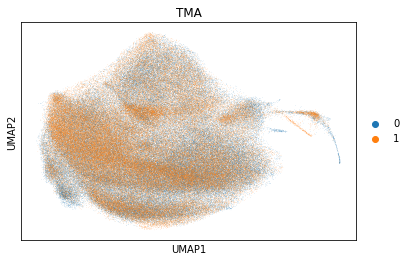

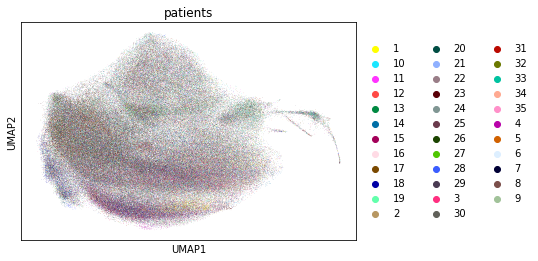

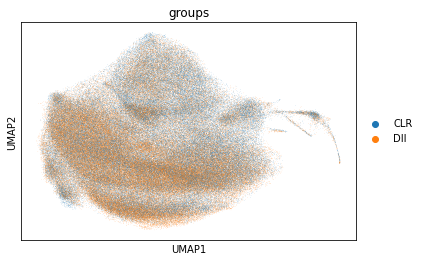

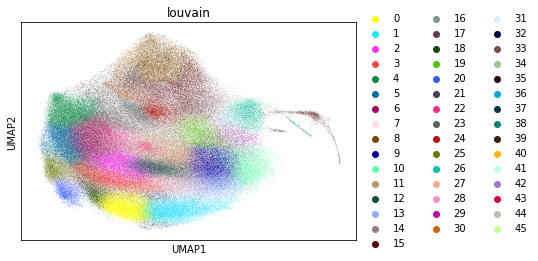

In [82]:
sc.pl.umap(adata_combined_All, color=['TMA'])
sc.pl.umap(adata_combined_All, color=['patients'])
sc.pl.umap(adata_combined_All, color=['groups'])
sc.pl.umap(adata_combined_All, color=['louvain'])

compute the cluster-specific markers using Wilcoxon

# Annotate the clusters based on the markers intensity
Here, we define a function for cell annotation which takes as input the processed adata object together with a set of thresholds for each marker/channel.
The function annotates the cells based on the specified thresholds and return the annotated adata object with the cell coordinates. 

In [604]:
def ProcessAdata(adata, 
                 CD3_quantile, CD4_quantile, CD8_quantile, CD45RO_quantile, 
                 CD20_quantile, CD138_quantile, CD38_quantile, CD45_quantile, 
                 CD56_quantile,
                 CD15_quantile,
                 CD25_quantile, FoxP3_quantile,
                 CD44_quantile, aSMA_quantile, vimentin_quantile,
                 p53_quantile, Cytokeratin_quantile, 
                 CD31_quantile, CD34_quantile,
                 CD11b_quantile, CD68_quantile, CD163_quantile,
                 GFAP_quantile, synaptophysin_quantile, podoplanin_quantile 
                ):
    
    ## extract the count data together with cell annotation
    import pandas as pd
    AnnotData = pd.concat([adata.to_df(), adata.obs], axis=1)
    AnnotData['CellID'] = AnnotData.index

    ## Define conditions for cell types classification    
    CD3_cond =  (AnnotData['CD3-Tcells'] >= AnnotData['CD3-Tcells'].quantile(0.99)) \
                       & (AnnotData.CD4 < AnnotData['CD4'].quantile(0.50)) \
                       & (AnnotData.CD8 < AnnotData['CD8'].quantile(0.50))  
    
        
    CD4_cond =  (AnnotData['CD3-Tcells'] >= AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                       & (AnnotData.CD4 >= AnnotData['CD4'].quantile(CD4_quantile)) \
                       & (AnnotData.CD8 < AnnotData['CD8'].quantile(CD8_quantile)) \
                       & (AnnotData['CD45RO-memory cells'] < AnnotData['CD45RO-memory cells'].quantile(CD45RO_quantile))
    
    
    CD8_cond = (AnnotData['CD3-Tcells'] >= AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                       & (AnnotData.CD8 >= AnnotData['CD8'].quantile(CD8_quantile)) \
                       & (AnnotData.CD4 < AnnotData['CD4'].quantile(CD4_quantile)) 
    
    CD4_CD45RO_cond =  (AnnotData['CD3-Tcells'] >= AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                       & (AnnotData.CD4 >= AnnotData['CD4'].quantile(CD4_quantile)) \
                       & (AnnotData['CD45RO-memory cells'] >= AnnotData['CD45RO-memory cells'].quantile(CD45RO_quantile)) 
    
        
    Treg_cond =  (AnnotData['CD25-IL-2Ra'] >= AnnotData['CD25-IL-2Ra'].quantile(CD25_quantile)) \
                       & (AnnotData.CD8 < AnnotData['CD8'].quantile(CD8_quantile)) \
                       & (AnnotData['FOXP3-Treg'] >= AnnotData['FOXP3-Treg'].quantile(FoxP3_quantile)) 
    

    Bcells_cond = (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                  & (AnnotData.CD20 >= AnnotData['CD20'].quantile(CD20_quantile))
  

    PlasmaCells_cond = (AnnotData['CD38-multifunctional'] >= AnnotData['CD38-multifunctional'].quantile(CD38_quantile)) \
                  & (AnnotData['CD20'] >= AnnotData['CD20'].quantile(CD20_quantile)) \
                  & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(CD3_quantile)) 
    
    
    granulocytes_cond = (AnnotData['CD15-granulocytes'] >= AnnotData['CD15-granulocytes'].quantile(CD15_quantile)) \
                           & (AnnotData['CD11b-macrophages'] >= AnnotData['CD11b-macrophages'].quantile(CD11b_quantile)) \
                           & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(0.85))
        
    
    CD68macrophages_cond = (AnnotData['CD68-macrophages'] >= AnnotData['CD68-macrophages'].quantile(CD68_quantile)) \
                              & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                              & (AnnotData['CD163-macrophages'] < AnnotData['CD163-macrophages'].quantile(CD163_quantile))

    
    CD68_163macrophages_cond = (AnnotData['CD68-macrophages'] >= AnnotData['CD68-macrophages'].quantile(0.50)) \
                                & (AnnotData['CD163-macrophages'] >= AnnotData['CD163-macrophages'].quantile(0.50)) \
                                & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(0.95))

    
    CD163macrophages_cond = (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                                & (AnnotData['CD68-macrophages'] < AnnotData['CD68-macrophages'].quantile(0.50)) \
                                & (AnnotData['CD163-macrophages'] >= AnnotData['CD163-macrophages'].quantile(CD163_quantile))
    
    
    CD11b_CD68_macrophages_cond = (AnnotData['CD68-macrophages'] >= AnnotData['CD68-macrophages'].quantile(CD68_quantile)) \
                                     & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                                     & (AnnotData['CD11b-macrophages'] >= AnnotData['CD11b-macrophages'].quantile(CD11b_quantile))

    
    NK_cond = (AnnotData['CD56-NK cells'] >= AnnotData['CD56-NK cells'].quantile(CD56_quantile)) \
                           & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(CD3_quantile)) 
    
    
    tumor_cond = (AnnotData['Cytokeratin'] >= AnnotData['Cytokeratin'].quantile(Cytokeratin_quantile)) \
                           & (AnnotData['p53'] >= AnnotData['p53'].quantile(p53_quantile)) \
                           & (AnnotData['aSMA-smooth muscle'] < AnnotData['aSMA-smooth muscle'].quantile(0.95))
    
    
    immune_cond = (AnnotData['CD20'] >= AnnotData['CD20'].quantile(CD20_quantile)) \
                           & (AnnotData['CD38-multifunctional'] >= AnnotData['CD38-multifunctional'].quantile(CD38_quantile)) \
                           & (AnnotData['CD15-granulocytes'] >= AnnotData['CD15-granulocytes'].quantile(CD15_quantile)) \
                           & (AnnotData['CD3-Tcells'] >= AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                           & (AnnotData['GFAP-nerves'] >= AnnotData['GFAP-nerves'].quantile(GFAP_quantile)) \
                           & (AnnotData['Cytokeratin'] < AnnotData['Cytokeratin'].quantile(Cytokeratin_quantile)) \
                           & (AnnotData['aSMA-smooth muscle'] < AnnotData['aSMA-smooth muscle'].quantile(aSMA_quantile))
    
    
    tumor_immune_cond = (AnnotData['CD20'] >= AnnotData['CD20'].quantile(CD20_quantile)) \
                           & (AnnotData['CD38-multifunctional'] >= AnnotData['CD38-multifunctional'].quantile(CD38_quantile)) \
                           & (AnnotData['CD15-granulocytes'] >= AnnotData['CD15-granulocytes'].quantile(CD15_quantile)) \
                           & (AnnotData['CD3-Tcells'] >= AnnotData['CD3-Tcells'].quantile(0.85)) \
                           & (AnnotData['GFAP-nerves'] >= AnnotData['GFAP-nerves'].quantile(GFAP_quantile)) \
                           & (AnnotData['Cytokeratin'] >= AnnotData['Cytokeratin'].quantile(0.85)) \
                           & (AnnotData['p53'] >= AnnotData['Cytokeratin'].quantile(Cytokeratin_quantile)) \
                           & (AnnotData['aSMA-smooth muscle'] < AnnotData['aSMA-smooth muscle'].quantile(aSMA_quantile))
    
    
    
    stroma_cond =  (AnnotData['Vimentin'] >= AnnotData['Vimentin'].quantile(vimentin_quantile)) \
                           & (AnnotData['Cytokeratin'] < AnnotData['Cytokeratin'].quantile(Cytokeratin_quantile))
        
        
    smMuscle_cond = (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(0.75)) \
                           & (AnnotData['Vimentin'] >= AnnotData['Vimentin'].quantile(vimentin_quantile)) \
                           & (AnnotData['aSMA-smooth muscle'] >= AnnotData['aSMA-smooth muscle'].quantile(aSMA_quantile))
    
    
    vascular_cond = (AnnotData['CD34-vasculature'] >= AnnotData['CD34-vasculature'].quantile(CD34_quantile)) \
                           & (AnnotData['CD31-vasculature'] >= AnnotData['CD31-vasculature'].quantile(CD31_quantile)) \
                           & (AnnotData['Cytokeratin'] < AnnotData['Cytokeratin'].quantile(Cytokeratin_quantile))
    
    Adipocytes_cond = (AnnotData['p53'] >= AnnotData['p53'].quantile(p53_quantile)) \
                           & (AnnotData['Vimentin'] >= AnnotData['Vimentin'].quantile(vimentin_quantile)) \
                           & (AnnotData['Cytokeratin'] < AnnotData['Cytokeratin'].quantile(Cytokeratin_quantile)) \
                           & (AnnotData['aSMA-smooth muscle'] < AnnotData['aSMA-smooth muscle'].quantile(0.50)) \
                           & (AnnotData['CD44-stroma'] < AnnotData['CD44-stroma'].quantile(CD44_quantile))
        
        
    nerves_cond = (AnnotData['GFAP-nerves'] >= AnnotData['GFAP-nerves'].quantile(GFAP_quantile)) \
                           & (AnnotData['Synaptophysin-neuroendocrine'] >= AnnotData['Synaptophysin-neuroendocrine'].quantile(synaptophysin_quantile)) \
                           & (AnnotData['Vimentin'] >= AnnotData['Vimentin'].quantile(vimentin_quantile)) \
                           & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(0.75)) 

    
    lymphatics_cond = (AnnotData['Podoplanin-lymphatics'] >= AnnotData['Podoplanin-lymphatics'].quantile(podoplanin_quantile)) \
                        & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(0.75))
    
    
    artifact_cond = (AnnotData['CD20'] < AnnotData['CD20'].quantile(CD20_quantile)) \
                           & (AnnotData['CD38-multifunctional'] < AnnotData['CD38-multifunctional'].quantile(CD38_quantile)) \
                           & (AnnotData['CD15-granulocytes'] < AnnotData['CD15-granulocytes'].quantile(CD15_quantile)) \
                           & (AnnotData['CD3-Tcells'] < AnnotData['CD3-Tcells'].quantile(CD3_quantile)) \
                           & (AnnotData['GFAP-nerves'] < AnnotData['GFAP-nerves'].quantile(GFAP_quantile)) \
                           & (AnnotData['Cytokeratin'] < AnnotData['Cytokeratin'].quantile(Cytokeratin_quantile)) \
                           & (AnnotData['p53'] < AnnotData['Cytokeratin'].quantile(Cytokeratin_quantile)) \
                           & (AnnotData['aSMA-smooth muscle'] < AnnotData['aSMA-smooth muscle'].quantile(aSMA_quantile)) \
                           & (AnnotData['Vimentin'] < AnnotData['Vimentin'].quantile(vimentin_quantile)) \
                           & (AnnotData['CD31-vasculature'] < AnnotData['CD31-vasculature'].quantile(CD31_quantile)) \
                           & (AnnotData['Podoplanin-lymphatics'] < AnnotData['Podoplanin-lymphatics'].quantile(podoplanin_quantile)) \
                           & (AnnotData['CD56-NK cells'] < AnnotData['CD56-NK cells'].quantile(CD56_quantile)) \
                           & (AnnotData['CD68-macrophages'] < AnnotData['CD68-macrophages'].quantile(CD68_quantile))
        
    ##############################################################
    # Classify the cell types based on the defined contitions above
    CD3_Tcells = AnnotData[CD3_cond]
    CD4_Tcells = AnnotData[CD4_cond]
    CD4_CD45RO_Tcells = AnnotData[CD4_CD45RO_cond]
    Tregs = AnnotData[Treg_cond]
    CD8_Tcells = AnnotData[CD8_cond]
    B_cells = AnnotData[Bcells_cond]
    plasma_cells = AnnotData[PlasmaCells_cond]
    granulocytes = AnnotData[granulocytes_cond]
    CD68_macrophages = AnnotData[CD68macrophages_cond]
    CD68_CD163_macrophages = AnnotData[CD68_163macrophages_cond]
    CD163macrophages = AnnotData[CD163macrophages_cond]
    CD11b_CD68_macrophages = AnnotData[CD11b_CD68_macrophages_cond]
    NK_cells = AnnotData[NK_cond]
    tumor_cells = AnnotData[tumor_cond]
    immune_cells = AnnotData[immune_cond]
    tumor_immune_cells = AnnotData[tumor_immune_cond]
    stromal_cells = AnnotData[stroma_cond]
    smooth_muscles = AnnotData[smMuscle_cond]
    vascular = AnnotData[vascular_cond]
    Adipocytes = AnnotData[Adipocytes_cond]
    nerves = AnnotData[nerves_cond]
    lymphatics = AnnotData[lymphatics_cond]
    artifact = AnnotData[artifact_cond]
    
    ####################################### 
     ## extract the coordinates
    CD3_coords = CD3_Tcells[['x', 'y']]
    CD4_coords = CD4_Tcells[['x', 'y']]
    CD4_CD45RO_coords = CD4_CD45RO_Tcells[['x', 'y']]
    Tregs_coords = Tregs[['x', 'y']]
    CD8_coords = CD8_Tcells[['x', 'y']]
    Bcells_coords = B_cells[['x', 'y']]
    plasma_cells_coords = plasma_cells[['x', 'y']]
    granulocytes_coords = granulocytes[['x', 'y']]
    CD68_macrophages_coords = CD68_macrophages[['x', 'y']]
    CD68_CD163_macrophages_coords = CD68_CD163_macrophages[['x', 'y']]
    CD163macrophages_coords = CD163macrophages[['x', 'y']]
    CD11b_CD68_macrophages_coords = CD11b_CD68_macrophages[['x', 'y']]
    NK_cells_coords = NK_cells[['x', 'y']]
    tumor_cells_coords = tumor_cells[['x', 'y']]
    immune_cells_coords = immune_cells[['x', 'y']]
    tumor_immune_cells_coords = tumor_immune_cells[['x', 'y']]
    stromal_cells_coords = stromal_cells[['x', 'y']]
    smooth_muscles_coords = smooth_muscles[['x', 'y']]
    vascular_coords = vascular[['x', 'y']]
    Adipocytes_coords = Adipocytes[['x', 'y']]
    nerves_coords = nerves[['x', 'y']]
    lymphatics_coords = lymphatics[['x', 'y']]
    artifact_coords = artifact[['x', 'y']]
    
    #######################################
    ## make a dict of coordinates
    coords = {
        'CD3+ T cells': CD3_coords,
        'CD4+ T cells': CD4_coords,
        'CD4+CD45RO+ T cells': CD4_CD45RO_coords,
        'Tregs': Tregs_coords,
        'CD8+ T cells': CD8_coords,
        'B cells': Bcells_coords,
        'plasma cells': plasma_cells_coords,
        'granulocytes': granulocytes_coords,
        'CD68+ macrophages': CD68_macrophages_coords,
        'CD68+CD163+ macrophages': CD68_CD163_macrophages_coords,
        'CD163+ macrophages': CD163macrophages_coords,
        'CD11b+CD68+ macrophages': CD11b_CD68_macrophages_coords,
        'NK cells': NK_cells_coords,
        'tumor cells': tumor_cells_coords,
        'immune cells': immune_cells_coords,
        'tumor/immune cells': tumor_immune_cells_coords,
        'stromal cells': stromal_cells_coords,
        'smooth muscles': smooth_muscles_coords,
        'vascular': vascular_coords,
        'Adipocytes': Adipocytes_coords,
        'nerves': nerves_coords,
        'lymphatics': lymphatics_coords,
        'artifact': artifact_coords
    }


    ##############################
    # Annotate the cells in the adata object
    adata_annot = adata.copy()
    adata_annot.obs['cell_types'] = np.nan
    for key in coords.keys():
        adata_annot.obs.loc[coords[key].index, 'cell_types'] = key

    ###############################
    ## Return the results
    return adata_annot, coords

Annotate the adata and get the cell coordinates

In [605]:
adata_combined_annot, coords = ProcessAdata(adata = adata_combined_All,
                                 CD3_quantile=0.50,
                                 CD4_quantile=0.50,
                                 CD8_quantile=0.50,
                                 CD45RO_quantile=0.50,
                                 CD20_quantile=0.50,
                                 CD11b_quantile=0.50,
                                 CD15_quantile=0.50,
                                 CD68_quantile=0.95,
                                 CD163_quantile=0.95,
                                 CD31_quantile=0.75,
                                 CD34_quantile=0.75,
                                 CD44_quantile=0.50,
                                 CD45_quantile=0.85,
                                 CD56_quantile=0.95,
                                 CD38_quantile=0.50,
                                 CD138_quantile=0.50,
                                 CD25_quantile=0.75,
                                 FoxP3_quantile=0.75,
                                 vimentin_quantile=0.50,
                                 aSMA_quantile=0.75,
                                 Cytokeratin_quantile=0.50,    
                                 p53_quantile=0.50,
                                 GFAP_quantile=0.80,
                                 synaptophysin_quantile=0.80,
                                 podoplanin_quantile=0.99)

look at the annotated cell types

In [606]:
adata_combined_annot.obs.cell_types.value_counts()

tumor cells                49328
smooth muscles             30348
CD68+CD163+ macrophages    26665
stromal cells              26464
granulocytes               15295
vascular                   12701
CD4+CD45RO+ T cells        11049
B cells                     9914
CD8+ T cells                9682
plasma cells                5863
artifact                    5126
CD4+ T cells                4376
nerves                      3290
tumor/immune cells          2782
CD68+ macrophages           2199
immune cells                1176
CD11b+CD68+ macrophages     1114
Tregs                       1094
lymphatics                   865
CD3+ T cells                 305
NK cells                     248
CD163+ macrophages           221
Name: cell_types, dtype: int64

Label unannotated cells as unknown

In [607]:
adata_combined_annot.obs.cell_types.isnull().sum()

52724

In [608]:
adata_combined_annot.obs.cell_types.fillna('unknown', inplace = True)

In [609]:
adata_combined_annot.obs.cell_types.value_counts()

unknown                    52724
tumor cells                49328
smooth muscles             30348
CD68+CD163+ macrophages    26665
stromal cells              26464
granulocytes               15295
vascular                   12701
CD4+CD45RO+ T cells        11049
B cells                     9914
CD8+ T cells                9682
plasma cells                5863
artifact                    5126
CD4+ T cells                4376
nerves                      3290
tumor/immune cells          2782
CD68+ macrophages           2199
immune cells                1176
CD11b+CD68+ macrophages     1114
Tregs                       1094
lymphatics                   865
CD3+ T cells                 305
NK cells                     248
CD163+ macrophages           221
Name: cell_types, dtype: int64

/Users/mohamedomar/opt/anaconda3/envs/pathml2/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_types' as categorical


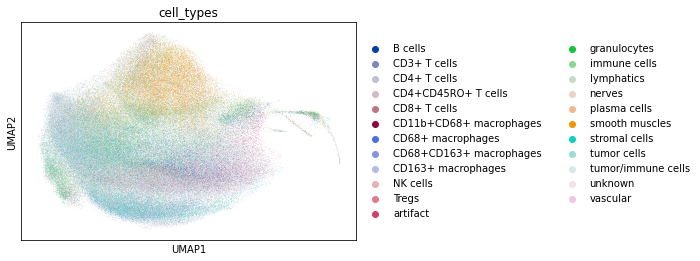

In [610]:
sc.pl.umap(adata_combined_annot, color=['cell_types'])

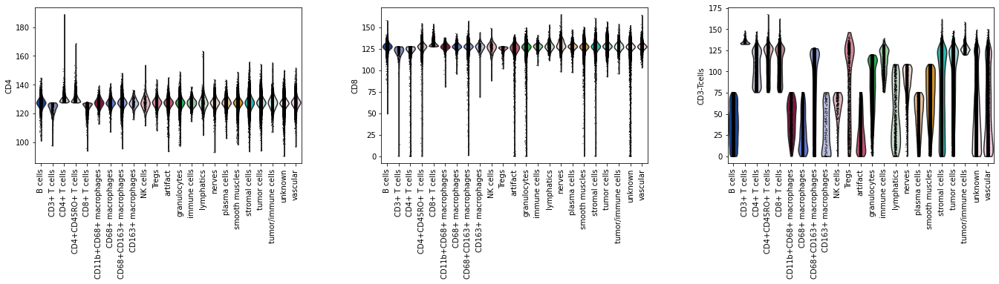

In [611]:
sc.pl.violin(adata_combined_annot, groupby='cell_types', keys=['CD4', 'CD8', 'CD3-Tcells'], rotation = 90)

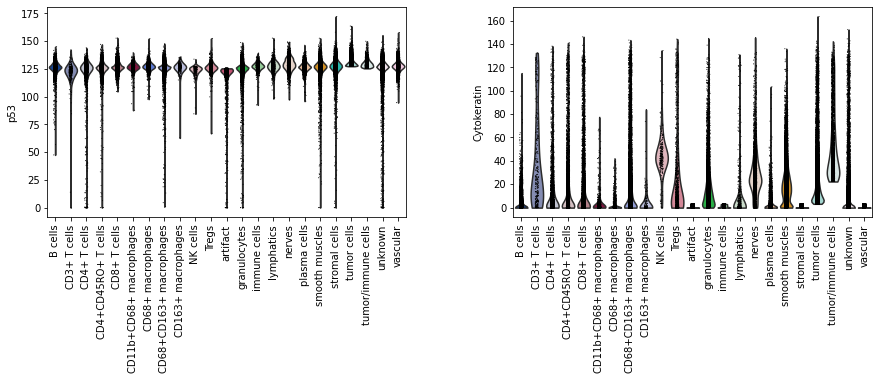

In [612]:
sc.pl.violin(adata_combined_annot, groupby='cell_types', keys=['p53', 'Cytokeratin'], rotation = 90)

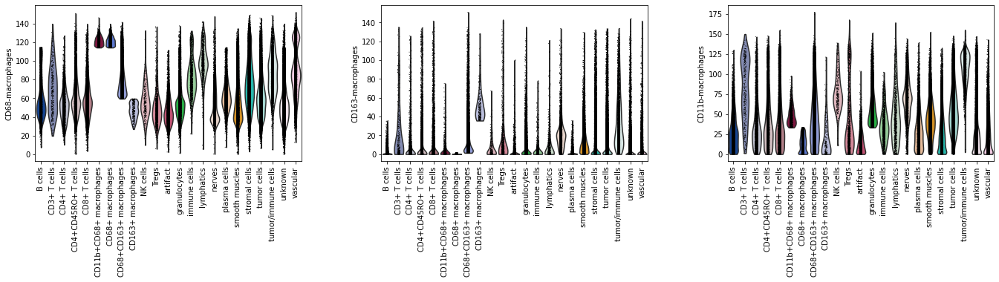

In [613]:
sc.pl.violin(adata_combined_annot, groupby='cell_types', keys=['CD68-macrophages', 'CD163-macrophages', 'CD11b-macrophages'], rotation = 90)

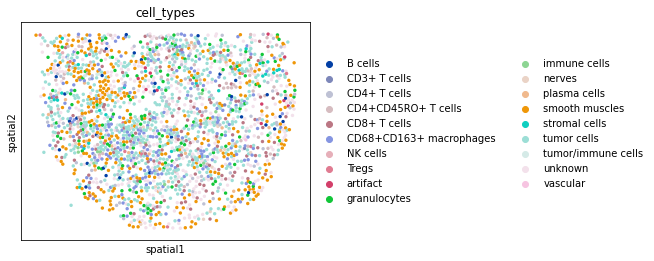

In [614]:
sc.pl.spatial(adata_combined_annot[adata_combined_annot.obs.Region == 'reg010_A'], color='cell_types', spot_size=25, size=1)

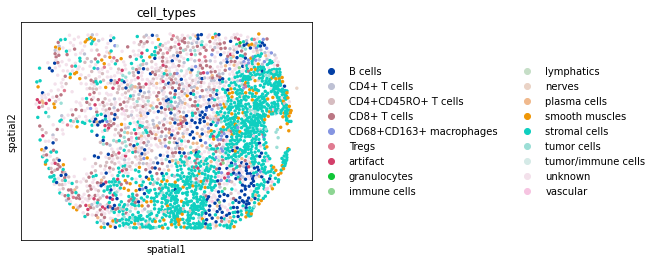

In [617]:
sc.pl.spatial(adata_combined_annot[adata_combined_annot.obs.Region == 'reg020_B'], color='cell_types', spot_size=25, size=1)

Put in a dataframe for further analysis

In [620]:
countData = adata_combined_annot.to_df()
countData['CellID'] = np.linspace(0, 272828, num= 272829).astype(int)
countData.set_index('CellID', inplace=True)

In [621]:
Obs = adata_combined_annot.obs
Obs['CellID'] = np.linspace(0, 272828, num= 272829).astype(int)
Obs.set_index('CellID', inplace=True)

In [706]:
Data = pd.concat([countData, Obs], axis = 1)
Data['CellID'] = Data.index

In [707]:
# Remove the cells with unknown annotation and the artifacts
Data = Data.loc[~Data['cell_types'].isin(['unknown'])]
Data = Data.loc[~Data['cell_types'].isin(['artifact'])]
Data['cell_types'] = Data['cell_types'].cat.remove_unused_categories()
Data['cell_types'] = Data['cell_types'].astype('str')

In [716]:
Data.shape

(214979, 82)

save

In [709]:
Data.to_csv('./data/CRC_pathml.csv')

In [717]:
Data.cell_types.value_counts()

tumor cells                49328
smooth muscles             30348
CD68+CD163+ macrophages    26665
stromal cells              26464
granulocytes               15295
vascular                   12701
CD4+CD45RO+ T cells        11049
B cells                     9914
CD8+ T cells                9682
plasma cells                5863
CD4+ T cells                4376
nerves                      3290
tumor/immune cells          2782
CD68+ macrophages           2199
immune cells                1176
CD11b+CD68+ macrophages     1114
Tregs                       1094
lymphatics                   865
CD3+ T cells                 305
NK cells                     248
CD163+ macrophages           221
Name: cell_types, dtype: int64

##########################################

# Identification of cellular neighborhoods

After identifying cell types, the next step is to identify cellular neighborhoods using the same approach described in Schürch et. al. and utilizing the code available from: https://github.com/nolanlab/NeighborhoodCoordination

In summary, for each cell, we are going to idenify the 10 nearest spatial neighbors (windows), then we are going to cluster these windows into distinct neighborhoods based on their cell type composition.

In [627]:
from sklearn.neighbors import NearestNeighbors
import time
import sys
from sklearn.cluster import MiniBatchKMeans
import seaborn as sns

In [629]:
# Function for identifying the windows 
def get_windows(job, n_neighbors):
    '''
    For each region and each individual cell in dataset, return the indices of the nearest neighbors.

    'job:  meta data containing the start time,index of region, region name, indices of region in original dataframe
    n_neighbors:  the number of neighbors to find for each cell
    '''
    start_time, idx, tissue_name, indices = job
    job_start = time.time()

    print("Starting:", str(idx + 1) + '/' + str(len(exps)), ': ' + exps[idx])

    # tissue_group: a grouped data frame with X and Y coordinates grouped by unique tissue regions
    tissue = tissue_group.get_group(tissue_name)
    
    to_fit = tissue.loc[indices][['x', 'y']].values

    # Unsupervised learner for implementing neighbor searches.
    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[['x', 'y']].values)

    # Find the nearest neighbors

    m = fit.kneighbors(to_fit)

    m = m[0], m[1]

    ## sort_neighbors
    args = m[0].argsort(axis=1)

    add = np.arange(m[1].shape[0]) * m[1].shape[1]

    sorted_indices = m[1].flatten()[args + add[:, None]]

    neighbors = tissue.index.values[sorted_indices]

    end_time = time.time()

    print("Finishing:", str(idx + 1) + "/" + str(len(exps)), ": " + exps[idx], end_time - job_start,
          end_time - start_time)
    return neighbors.astype(np.int32)

In [737]:
Data = pd.read_csv('./data/CRC_pathml.csv')

In [738]:
# make dummy variables
Data = pd.concat([Data,pd.get_dummies(Data['cell_types'])], axis = 1)
# Extract the cell types with dummy variables
sum_cols = Data['cell_types'].unique()
values = Data[sum_cols].values

find windows for each cell in each tissue region

In [739]:
# Keep the X and Y coordianates + the tissue regions >> then group by tissue regions (140 unique regions)
tissue_group = Data[['x','y','Region']].groupby('Region')

# Create a list of unique tissue regions
exps = list(Data['Region'].unique())

# time.time(): current time is seconds
# indices: a list of indices (rownames) of each dataframe in tissue_group
# exps.index(t) : t represents the index of each one of the indices eg, exps.index("reg001_A") is 0 and exps.index("reg001_B") is 1 and so on
# t is the name of tissue regions eg, reg001_A
tissue_chunks = [(time.time(),exps.index(t),t,a) for t,indices in tissue_group.groups.items() for a in np.array_split(indices,1)]

# Get the window (the 20 closest cells to each cell in each tissue region)
tissues = [get_windows(job,20) for job in tissue_chunks]

Starting: 61/140 : reg001_A
Finishing: 61/140 : reg001_A 0.008691072463989258 0.021989107131958008
Starting: 77/140 : reg001_B
Finishing: 77/140 : reg001_B 0.007447004318237305 0.0295560359954834
Starting: 19/140 : reg002_A
Finishing: 19/140 : reg002_A 0.008589982986450195 0.03844809532165527
Starting: 101/140 : reg002_B
Finishing: 101/140 : reg002_B 0.008079051971435547 0.04688000679016113
Starting: 58/140 : reg003_A
Finishing: 58/140 : reg003_A 0.006365299224853516 0.05353426933288574
Starting: 85/140 : reg003_B
Finishing: 85/140 : reg003_B 0.00391387939453125 0.057784080505371094
Starting: 65/140 : reg004_A
Finishing: 65/140 : reg004_A 0.006309986114501953 0.0642392635345459
Starting: 71/140 : reg004_B
Finishing: 71/140 : reg004_B 0.006356954574584961 0.07086682319641113
Starting: 40/140 : reg005_A
Finishing: 40/140 : reg005_A 0.011285066604614258 0.08248305320739746
Starting: 105/140 : reg005_B
Finishing: 105/140 : reg005_B 0.007071018218994141 0.08987975120544434
Starting: 8/140 :

################################

for each cell and its nearest neighbors, reshape and count the number of each cell type in those neighbors.

In [740]:
ks = [20]
out_dict = {}
for k in ks:
    for neighbors, job in zip(tissues, tissue_chunks):
        chunk = np.arange(len(neighbors))  # indices
        tissue_name = job[2]
        indices = job[3]
        window = values[neighbors[chunk, :k].flatten()].reshape(len(chunk), k, len(sum_cols)).sum(axis=1)
        out_dict[(tissue_name, k)] = (window.astype(np.float16), indices)

concatenate the summed windows and combine into one dataframe for each window size tested.

In [741]:
keep_cols = ['x','y','Region','cell_types']
windows = {}
for k in ks:
    window = pd.concat(
        [pd.DataFrame(out_dict[(exp, k)][0], index=out_dict[(exp, k)][1].astype(int), columns=sum_cols) for exp in
         exps], 0)
    window = window.loc[Data.index.values]
    window = pd.concat([Data[keep_cols], window], 1)
    windows[k] = window

<ipython-input-741-dbc25edfe709>:4: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  window = pd.concat(
<ipython-input-741-dbc25edfe709>:8: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  window = pd.concat([Data[keep_cols], window], 1)


In [743]:
neighborhood_name = "neighborhood"+str(k)
k_centroids = {}

windows2 = windows[20]

Clustering the windows

In [748]:
km = MiniBatchKMeans(n_clusters = 15,random_state=0)

labelskm = km.fit_predict(windows2[sum_cols].values)
k_centroids[20] = km.cluster_centers_
Data['neighborhood20'] = labelskm
Data[neighborhood_name] = Data[neighborhood_name].astype('category')

In [746]:
cell_order = ['tumor cells',
              'CD68+CD163+ macrophages',
              'CD11b+CD68+ macrophages',
              'CD68+ macrophages',
              'CD163+ macrophages',
              'granulocytes',
              'NK cells',
              'CD3+ T cells',
              'CD4+ T cells',
              'CD4+CD45RO+ T cells',
              'CD8+ T cells',
              'Tregs',
              'B cells', 
              'plasma cells',
              'tumor/immune cells',
              'immune cells',
              'smooth muscles',
              'stromal cells',
              'vascular',
              'lymphatics',
              'nerves'
             ]

This plot shows the cell types abundance in the different niches (0-9)

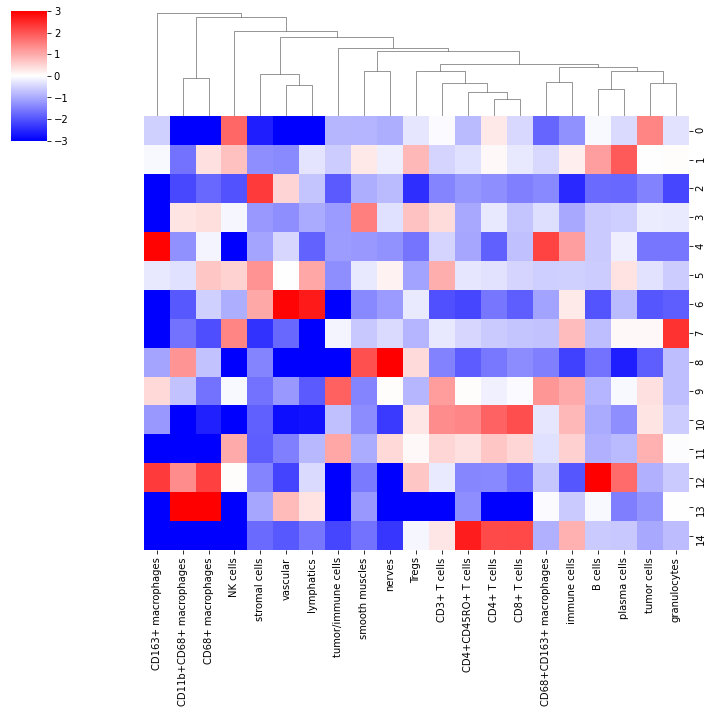

In [749]:
niche_clusters = (k_centroids[20])
tissue_avgs = values.mean(axis = 0)
fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
fc = pd.DataFrame(fc,columns = sum_cols)
s=sns.clustermap(fc.loc[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14],cell_order], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = False)

Visualize the identified neighborhoods on the slides in each clinical group

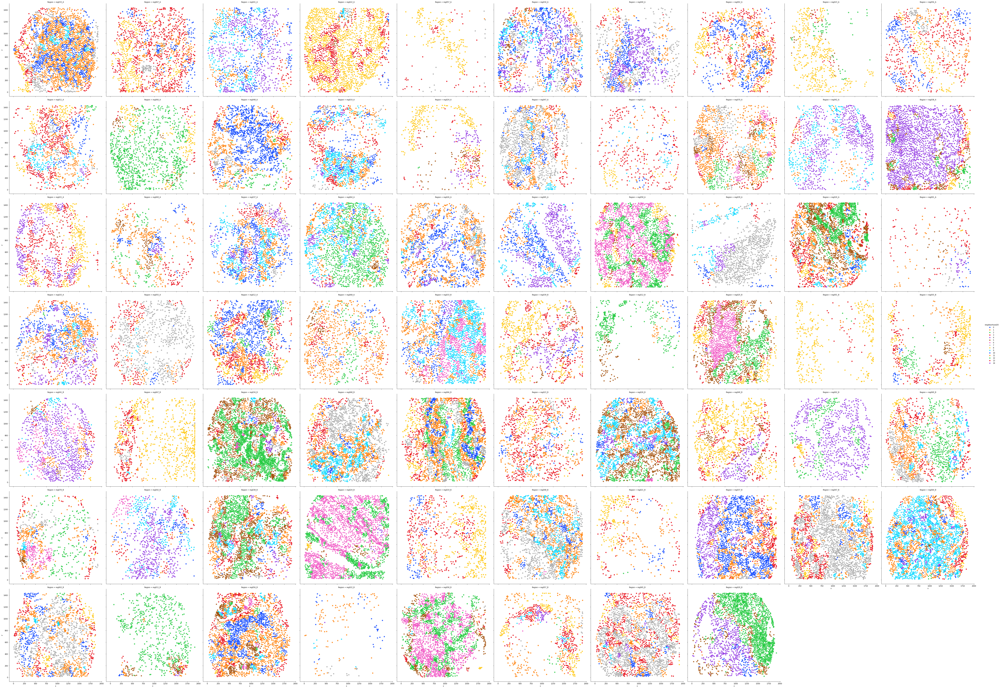

In [752]:
# CLR
Data['neighborhood20'] = Data['neighborhood20'].astype('category')
sns.lmplot(data = Data[Data['groups']=='CLR'],x = 'x',y='y',hue = 'neighborhood20',palette = 'bright',height = 8, col = 'Region', col_wrap = 10,fit_reg = False)

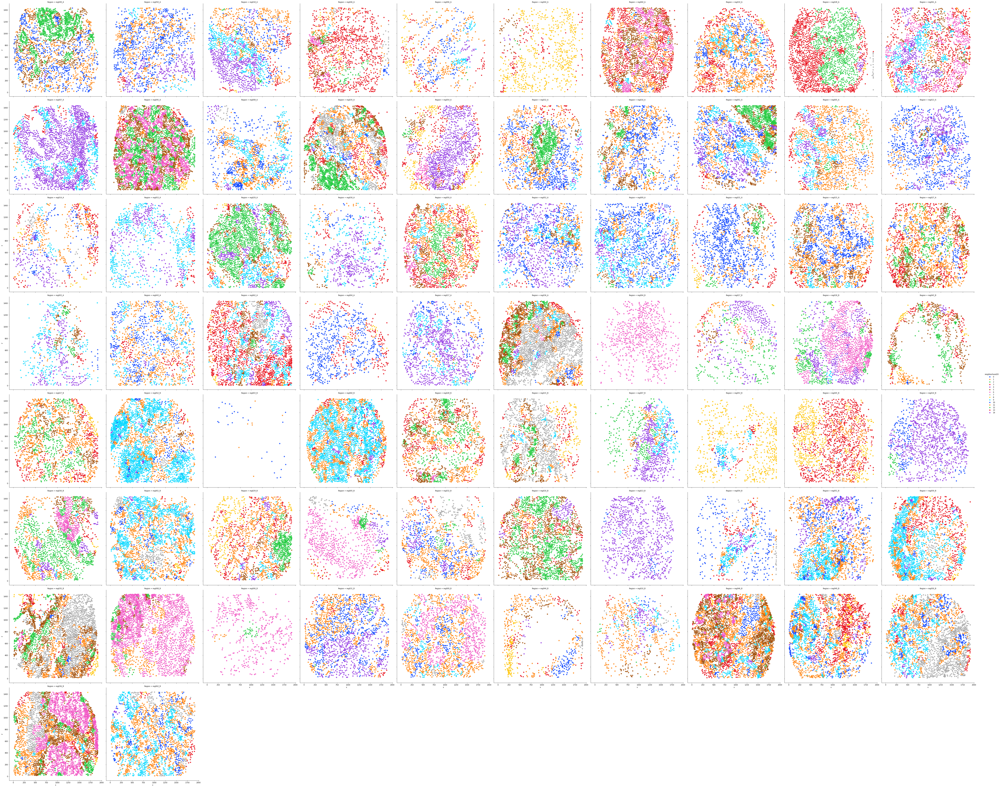

In [753]:
# DII
Data['neighborhood20'] = Data['neighborhood20'].astype('category')
sns.lmplot(data = Data[Data['groups']=='DII'],x = 'x',y='y',hue = 'neighborhood20',palette = 'bright',height = 8,col = 'Region', col_wrap = 10,fit_reg = False)

plot for each group and each patient the percent of total cells allocated to each neighborhood

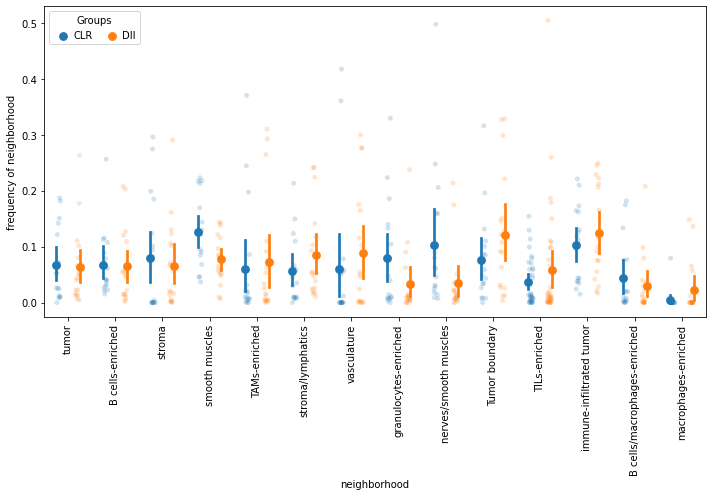

In [756]:
fc = Data.groupby(['patients','groups']).apply(lambda x: x['neighborhood20'].value_counts(sort = False,normalize = True))

fc.columns = range(15)
melt = pd.melt(fc.reset_index(),id_vars = ['patients','groups'])
melt = melt.rename(columns = {'variable':'neighborhood','value':'frequency of neighborhood'})
melt['neighborhood'] = melt['neighborhood'].map({0: 'tumor', 
                                                 1: 'B cells-enriched', 
                                                 2: 'stroma', 
                                                 3:'smooth muscles', 
                                                 4:'TAMs-enriched', 
                                                 5:'stroma/lymphatics', 
                                                 6:'vasculature', 
                                                 7:'granulocytes-enriched', 
                                                 8:'nerves/smooth muscles', 
                                                 9:'Tumor boundary',
                                                 10: 'TILs-enriched',
                                                 11: 'immune-infiltrated tumor',
                                                 12: 'B cells/macrophages-enriched',
                                                 13: 'macrophages-enriched',
                                                 14: 'TILs-enriched'})

f,ax = plt.subplots(figsize = (10,7))
sns.stripplot(data = melt, hue = 'groups',dodge = True,alpha = .2,x ='neighborhood', y ='frequency of neighborhood')
sns.pointplot(data = melt, scatter_kws  = {'marker': 'd'},hue = 'groups',dodge = .5,join = False,x ='neighborhood', y ='frequency of neighborhood')
handles, labels = ax.get_legend_handles_labels()
plt.xticks(rotation=90, fontsize="10", ha="center")
ax.legend(handles[:2], labels[:2], title="Groups",
          handletextpad=0, columnspacing=1,
          loc="upper left", ncol=3, frameon=True)
plt.tight_layout()